<a href="https://colab.research.google.com/github/jronald88/Smoking_classifier/blob/main/smoking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Body signal of smoking machine learning project**
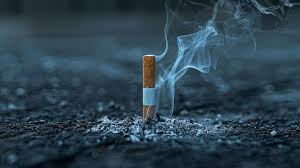

**Problem Statement:**

---



Given a dataset of individuals with various body indicators (e.g., BMI, age, height, weight), predict whether or not a person is a smoker.

**Task**

---


Classification: Predict whether a person is a smoker or non-smoker based on their body indicators.

In [1]:
!pip install -r "/workspaces/Smoking_classifier/src/requirements.txt"

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 1.6 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 51.4 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.3/16.3 MB 41.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 MB 13.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 34.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 45.4 MB/s eta 0:00:00:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.0/45.0 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 55.3 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.

In [2]:
!mkdir ~/.kaggle

In [3]:
!cp kaggle.json ~/.kaggle/

In [4]:
! chmod 600 ~/.kaggle/kaggle.json

In [5]:
!kaggle datasets download kukuroo3/body-signal-of-smoking


/bin/bash: line 1: kaggle: command not found


In [6]:
!unzip "/workspaces/Smoking_classifier/src/body-signal-of-smoking.zip"

Archive:  /workspaces/Smoking_classifier/src/body-signal-of-smoking.zip
  inflating: competition_format/x_test.csv  
  inflating: competition_format/x_train.csv  
  inflating: competition_format/y_test.csv  
  inflating: competition_format/y_train.csv  
replace smoking.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


#**All Imports**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
!pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 601.3/601.3 MB 1.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.7/133.7 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 26.9 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 35.5 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 29.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 23.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.6 MB/s eta

In [8]:
!pip install flask-sqlalchemy

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 5.0 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: pip install --upgrade pip


In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler, RobustScaler, LabelEncoder
from sklearn.feature_selection import f_classif, SelectKBest
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import preprocessing
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, mean_squared_error, f1_score, make_scorer
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.linear_model import LogisticRegression, Ridge
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn import tree
from sklearn import metrics
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.svm import SVC, SVR
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
import tensorflow as tf

from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense, Dropout, Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.optimizers import Adam

from xgboost import XGBClassifier
from xgboost import plot_importance

from pickle import dump

from flask_sqlalchemy import SQLAlchemy

import sqlite3
import timeit

2024-09-27 09:57:32.985800: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-09-27 09:57:33.126644: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-09-27 09:57:33.187562: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-27 09:57:33.311354: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-27 09:57:33.337654: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-27 09:57:33.584714: I tensorflow/core/platform/cpu_feature_gu

In [10]:
df_smoking = pd.read_csv("/workspaces/Smoking_classifier/src/smoking.csv")

**Exploratory Data Analysis**

In [ ]:
df_smoking.shape


(55692, 27)

In [ ]:
df_smoking.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 55692 entries, 0 to 55691
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   55692 non-null  int64  
 1   gender               55692 non-null  object 
 2   age                  55692 non-null  int64  
 3   height(cm)           55692 non-null  int64  
 4   weight(kg)           55692 non-null  int64  
 5   waist(cm)            55692 non-null  float64
 6   eyesight(left)       55692 non-null  float64
 7   eyesight(right)      55692 non-null  float64
 8   hearing(left)        55692 non-null  float64
 9   hearing(right)       55692 non-null  float64
 10  systolic             55692 non-null  float64
 11  relaxation           55692 non-null  float64
 12  fasting blood sugar  55692 non-null  float64
 13  Cholesterol          55692 non-null  float64
 14  triglyceride         55692 non-null  float64
 15  HDL                  55692 non-null 

In [ ]:
df_smoking.isnull().sum()

,0
ID,0
gender,0
age,0
height(cm),0
weight(kg),0
waist(cm),0
eyesight(left),0
eyesight(right),0
hearing(left),0
hearing(right),0


In [ ]:
df_smoking.describe(include=np.number).T


,count,mean,std,min,25%,50%,75%,max
ID,55692.0,27845.500000,16077.039933,0.0,13922.75,27845.5,41768.25,55691.0
age,55692.0,44.182917,12.071418,20.0,40.00,40.0,55.00,85.0
height(cm),55692.0,164.649321,9.194597,130.0,160.00,165.0,170.00,190.0
weight(kg),55692.0,65.864936,12.820306,30.0,55.00,65.0,75.00,135.0
waist(cm),55692.0,82.046418,9.274223,51.0,76.00,82.0,88.00,129.0
eyesight(left),55692.0,1.012623,0.486873,0.1,0.80,1.0,1.20,9.9
eyesight(right),55692.0,1.007443,0.485964,0.1,0.80,1.0,1.20,9.9
hearing(left),55692.0,1.025587,0.157902,1.0,1.00,1.0,1.00,2.0
hearing(right),55692.0,1.026144,0.159564,1.0,1.00,1.0,1.00,2.0
systolic,55692.0,121.494218,13.675989,71.0,112.00,120.0,130.00,240.0


In [ ]:
df_smoking.describe(include='O').T

,count,unique,top,freq
gender,55692,2,M,35401
oral,55692,1,Y,55692
tartar,55692,2,Y,30940


In [ ]:
!pwd #print present working directory

/content


#**SQL**



In [11]:
conn = sqlite3.connect("/workspaces/Smoking_classifier/src/smoking.db")
df_smoking.to_sql("df_smoking", conn, if_exists = "replace", index = False)

55692

In [12]:
# Execute a SQL query to retrieve data from the database
query = "SELECT * FROM df_smoking"
cursor = conn.cursor()
cursor.execute(query)
results = cursor.fetchall()

smoking = pd.DataFrame(results, columns=[column[0] for column in cursor.description])
# Close the database connection
conn.close()


In [ ]:
smoking.head()  # Print the first few rows of the DataFrame

,ID,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),...,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,smoking
0,0,F,40,155,60,81.3,1.2,1.0,1.0,1.0,...,12.9,1.0,0.7,18.0,19.0,27.0,Y,0,Y,0
1,1,F,40,160,60,81.0,0.8,0.6,1.0,1.0,...,12.7,1.0,0.6,22.0,19.0,18.0,Y,0,Y,0
2,2,M,55,170,60,80.0,0.8,0.8,1.0,1.0,...,15.8,1.0,1.0,21.0,16.0,22.0,Y,0,N,1
3,3,M,40,165,70,88.0,1.5,1.5,1.0,1.0,...,14.7,1.0,1.0,19.0,26.0,18.0,Y,0,Y,0
4,4,F,40,155,60,86.0,1.0,1.0,1.0,1.0,...,12.5,1.0,0.6,16.0,14.0,22.0,Y,0,N,0


**Clean the data**

In [ ]:
print(f'There are {df_smoking.duplicated().sum()} duplicated values')

There are 0 duplicated values


In [ ]:
df_smoking.columns

Index(['ID', 'gender', 'age', 'height(cm)', 'weight(kg)', 'waist(cm)',
       'eyesight(left)', 'eyesight(right)', 'hearing(left)', 'hearing(right)',
       'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol',
       'triglyceride', 'HDL', 'LDL', 'hemoglobin', 'Urine protein',
       'serum creatinine', 'AST', 'ALT', 'Gtp', 'oral', 'dental caries',
       'tartar', 'smoking'],
      dtype='object')

In [13]:
smoking.drop('ID', axis=1, inplace=True)

#**Data Visualisation**

From the heatmap there is a lot of correlation to be seen. Some obvious (height/weight).

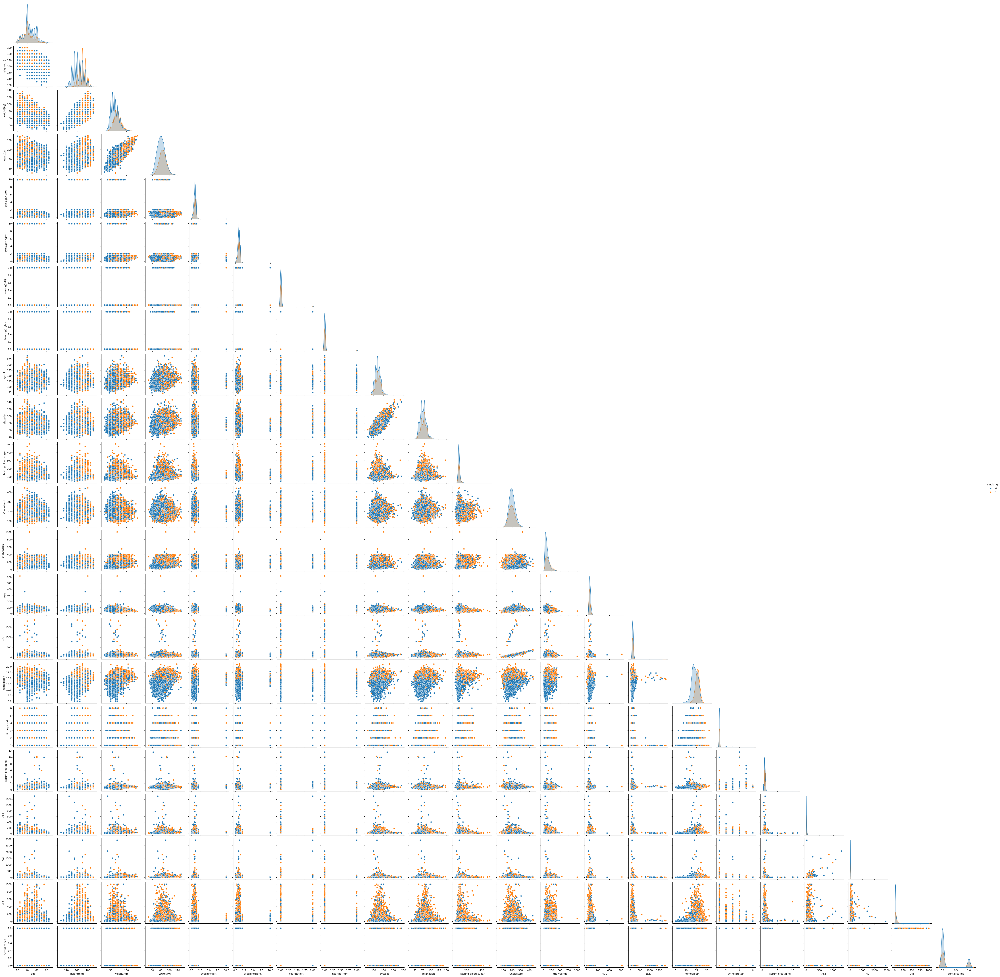

In [ ]:
sns.pairplot(smoking, hue = "smoking", corner=True)

In [ ]:
smoking_obj = smoking.describe(include='O')
smoking_obj

,gender,oral,tartar
count,55692,55692,55692
unique,2,1,2
top,M,Y,Y
freq,35401,55692,30940


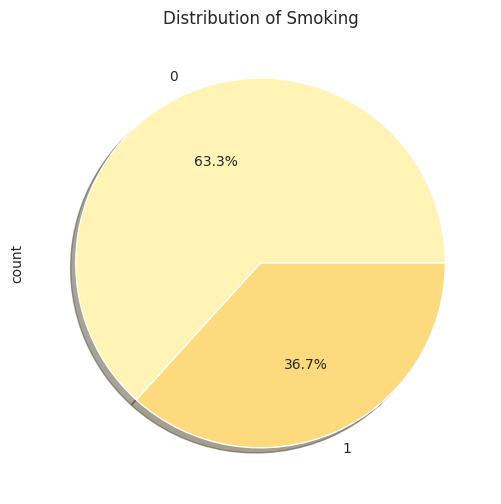

In [99]:
smoking['smoking'].value_counts().plot.pie(autopct='%1.1f%%', shadow = True, figsize = (6,6))
plt.title('Distribution of Smoking')
plt.savefig("./pictures/smoking_dist.jpg")
plt.show()

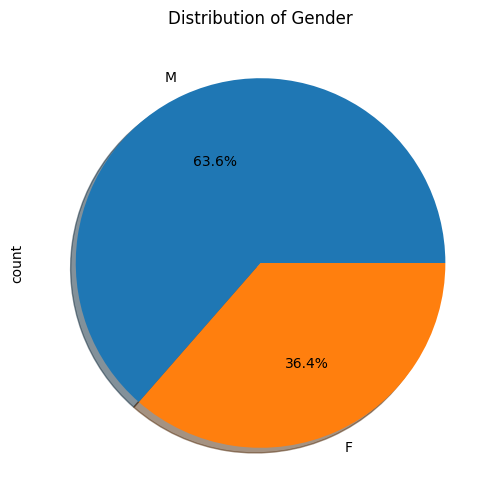

In [ ]:
smoking['gender'].value_counts().plot.pie(autopct='%1.1f%%', shadow = True, figsize = (6,6))
plt.title('Distribution of Gender')
plt.show()

Text(0.5, 1.0, 'Distribution of Smokers via Gender')

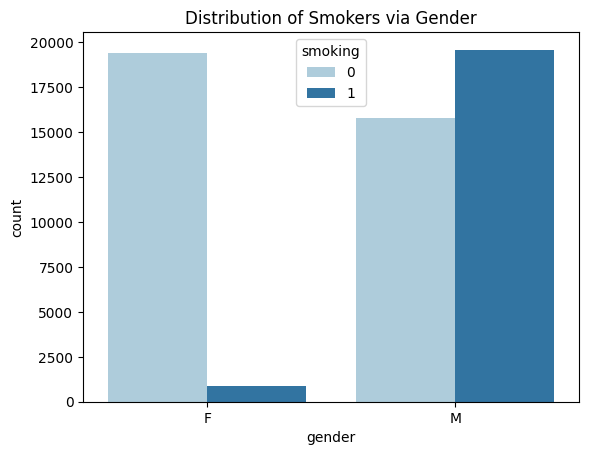

In [ ]:
sns.countplot(x='gender', hue='smoking', data=smoking, palette = "Paired")
plt.title('Distribution of Smokers via Gender')  #change

Text(0.5, 1.0, 'Oral Examination Status')

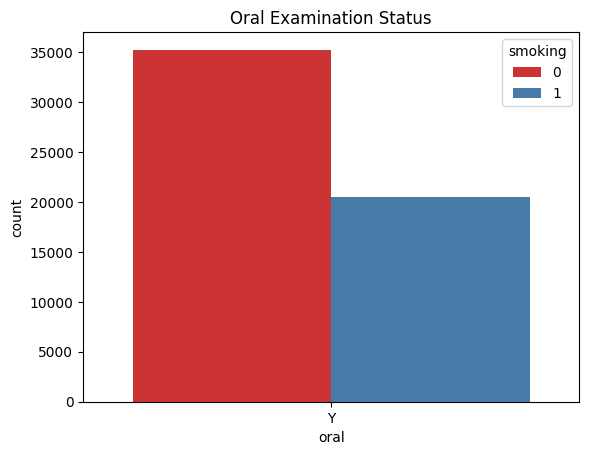

In [ ]:
sns.countplot(x='oral', hue='smoking', data=smoking, palette = "Set1")
plt.title('Oral Examination Status')  #change


Text(0.5, 1.0, 'Presence of Tartar')

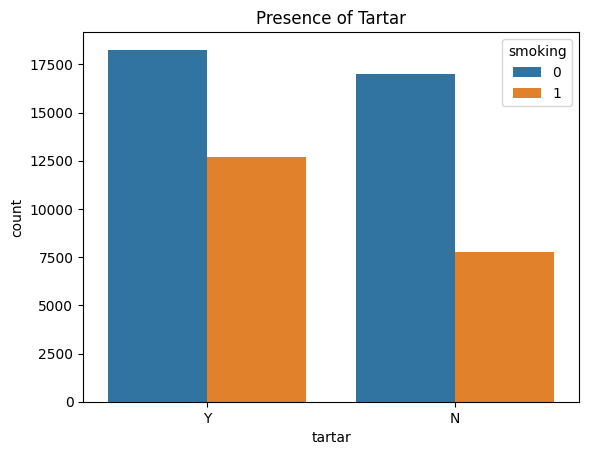

In [ ]:
sns.countplot(x='tartar', hue='smoking', data=smoking)
plt.title('Presence of Tartar')  #change

<Axes: xlabel='smoking', ylabel='Cholesterol'>

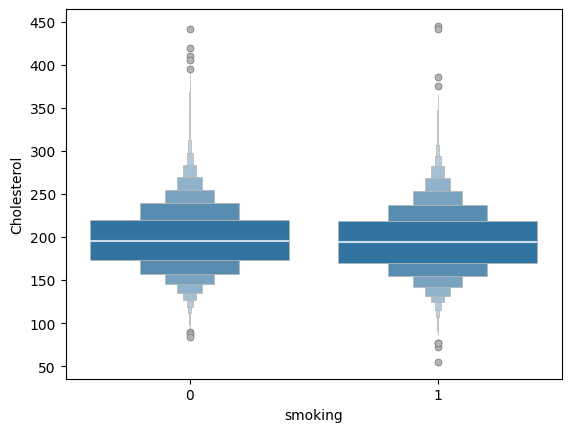

In [ ]:
sns.boxenplot(data=smoking, x='smoking', y='Cholesterol',linewidth=.5, linecolor=".7",
              line_kws=dict(linewidth=1.5, color="#cde"),
              flier_kws=dict(facecolor=".7", linewidth=.5))

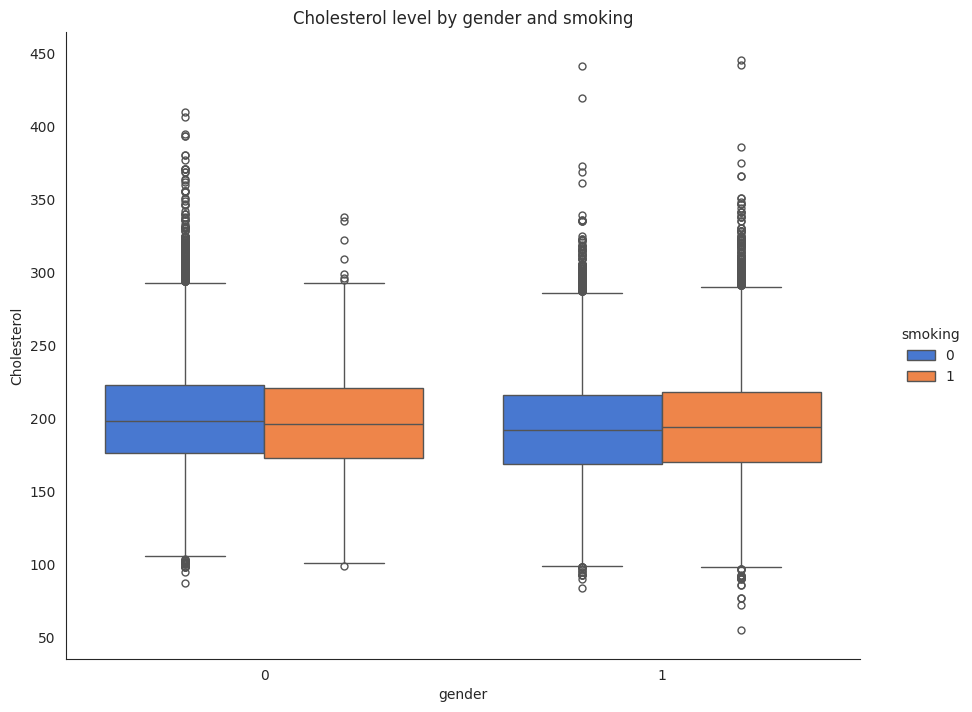

In [98]:
sns.catplot(x = "gender",
            y = "Cholesterol",
            kind = "box",
            hue = "smoking",
            palette = 'muted',
            data = smoking, saturation = 1, height = 7, aspect = 1.3,
            margin_titles = True).set(title = "Cholesterol level by gender and smoking");
plt.savefig("./pictures/chol_gend_smoking_box.jpg")

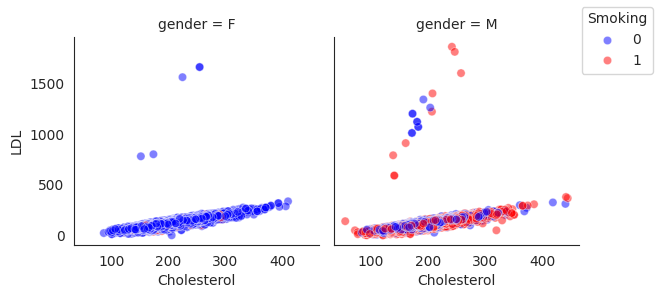

<Figure size 1500x1500 with 0 Axes>

In [ ]:
g = sns.FacetGrid(smoking,col='gender')
plt.figure(figsize=(15,15))
g.map_dataframe(sns.scatterplot,x='Cholesterol',y='LDL', hue='smoking',data=smoking[smoking['LDL'] < 1000], alpha = 0.5, palette={0:'blue',1:'red'})
legend = g.add_legend(title='Smoking', loc='upper right', frameon=True)



*  0 refers to non-smokers
*  1 refers to smokers

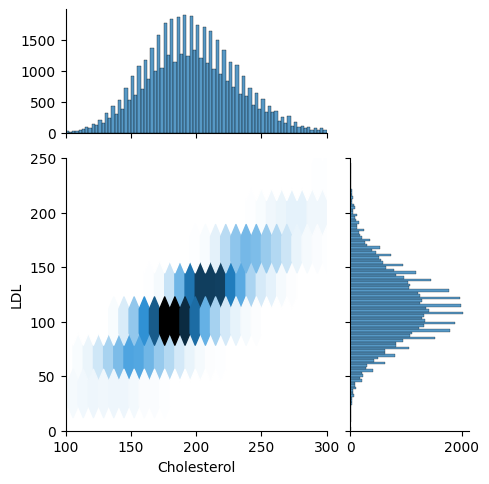

In [ ]:
# Hex Plot with Histogram margins
hex = sns.jointplot(x="Cholesterol", y="LDL", data=smoking,
              height=5, kind='hex', ratio=2, marginal_ticks=True, xlim=(100,300),ylim=(0,250));



#**Feature Engineering**

In [14]:
smoking['BMI'] = smoking['weight(kg)'] / (smoking['height(cm)'] / 100) ** 2
smoking.head()

,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,...,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,smoking,BMI
0,F,40,155,60,81.3,1.2,1.0,1.0,1.0,114.0,...,1.0,0.7,18.0,19.0,27.0,Y,0,Y,0,24.973985
1,F,40,160,60,81.0,0.8,0.6,1.0,1.0,119.0,...,1.0,0.6,22.0,19.0,18.0,Y,0,Y,0,23.437500
2,M,55,170,60,80.0,0.8,0.8,1.0,1.0,138.0,...,1.0,1.0,21.0,16.0,22.0,Y,0,N,1,20.761246
3,M,40,165,70,88.0,1.5,1.5,1.0,1.0,100.0,...,1.0,1.0,19.0,26.0,18.0,Y,0,Y,0,25.711662
4,F,40,155,60,86.0,1.0,1.0,1.0,1.0,120.0,...,1.0,0.6,16.0,14.0,22.0,Y,0,N,0,24.973985


FileNotFoundError: [Errno 2] No such file or directory: '/workspaces/Smoking_classifier/src/images/dist_BMI.jpg'

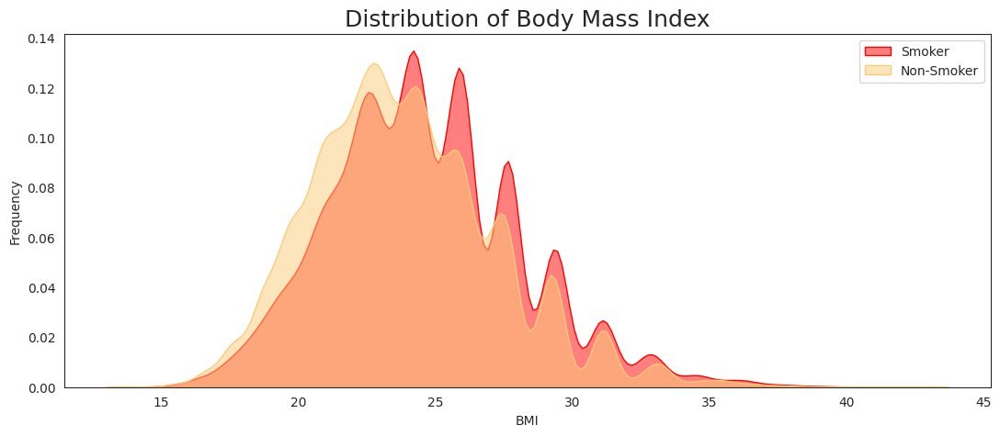

In [97]:
fig, ax = plt.subplots(figsize = (13,5))
sns.kdeplot(smoking[smoking["smoking"]==1]["BMI"], alpha=0.5,fill = True, color="red", label="Smoker", ax = ax)
sns.kdeplot(smoking[smoking["smoking"]==0]["BMI"], alpha=0.5,fill = True, color="#fccc79", label="Non-Smoker", ax = ax)
plt.title('Distribution of Body Mass Index', fontsize = 18)
ax.set_xlabel("BMI")
ax.set_ylabel("Frequency")
ax.legend();
plt.savefig("./images/dist_BMI.jpg")
plt.show()

In [15]:
!pip install seaborn --upgrade

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: pip install --upgrade pip


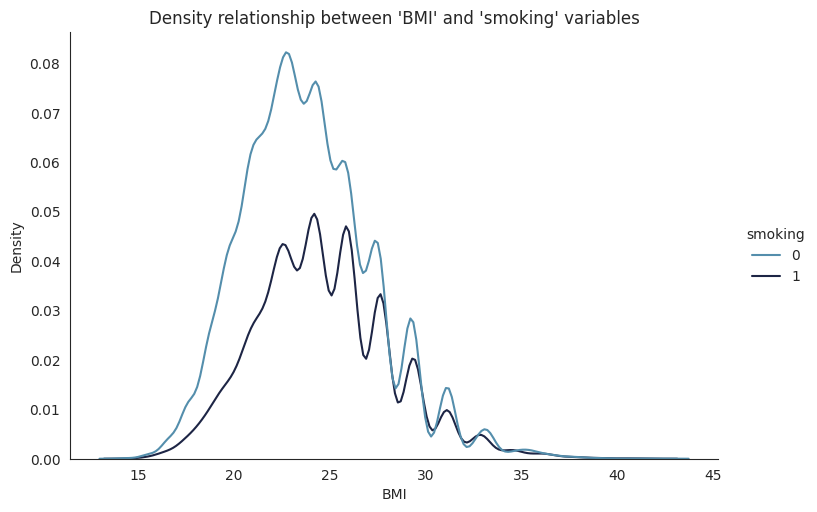

In [96]:
sns.displot(data=smoking, x = "BMI", hue='smoking',
    kind = "kde", height = 5, aspect = 1.5,
    palette="ch:rot=-.25,hue=1,light=.50").set(title = "Density relationship between 'BMI' and 'smoking' variables")
plt.savefig("./pictures/density_rel_BMI_smoking.jpg")

In [ ]:
smokers_df = smoking[smoking['smoking'] == 1]
smokers_var = smokers_df.BMI.var()
smokers_skew = smokers_df['BMI'].skew()


In [ ]:
non_smokers_df = smoking[smoking['smoking'] == 0]
non_smokers_var = non_smokers_df.BMI.var()
non_smokers_skew = non_smokers_df['BMI'].skew()


In [ ]:
print(f"Skewness for smokers: {smokers_skew}")
print(f"Skewness for non-smokers: {non_smokers_skew}")
print(f'Variance for smokers: {smokers_var}')
print(f'Variance for non-smokers: {non_smokers_var}')

Skewness for smokers: 0.5039086058565625
Skewness for non-smokers: 0.6139684525455762
Variance for smokers: 12.415112480211201
Variance for non-smokers: 11.684983849165667


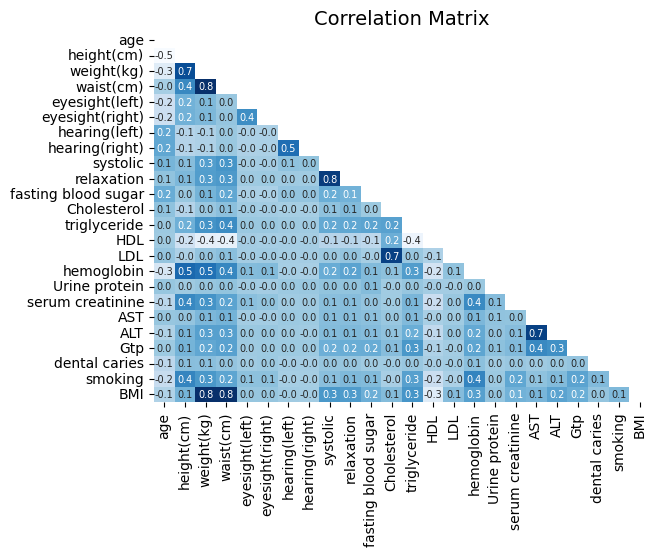

<Figure size 1000x1000 with 0 Axes>

In [17]:
corr = smoking.select_dtypes(include=np.number).corr()
mask = np.triu(np.ones_like(corr, dtype = bool))
sns.heatmap(smoking.select_dtypes(include=np.number).corr(),annot=True, cbar=False,fmt=".1f", cmap = 'Blues',annot_kws={"size": 7},mask=mask)
plt.title('Correlation Matrix', fontsize = 14)
plt.figure(figsize=(10,10))
plt.tight_layout()


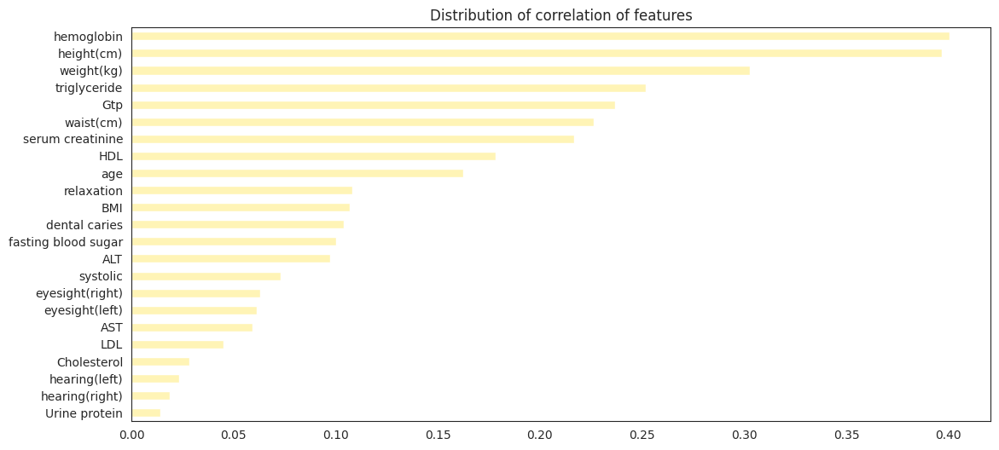

In [95]:
sns.set_style('white')
sns.set_palette('YlOrBr')
plt.figure(figsize = (13,6))
plt.title('Distribution of correlation of features')
correlation_values = abs(corr['smoking']).sort_values()[:-1].plot.barh()
plt.savefig("./pictures/distribution_corr.jpg")
plt.show()

In [ ]:
pmcc = smoking.select_dtypes(include=np.number).corr(method = 'pearson')
pmcc

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking,BMI
age,1.000000,-0.479528,-0.324706,-0.026297,-0.195472,-0.192723,0.203993,0.208722,0.134023,0.050745,...,0.043007,-0.263078,0.029625,-0.106118,0.032576,-0.063937,0.013031,-0.114984,-0.162557,-0.063384
height(cm),-0.479528,1.000000,0.675656,0.378902,0.151133,0.155665,-0.078663,-0.078323,0.080585,0.113193,...,-0.048419,0.539367,0.005128,0.383883,0.041737,0.126511,0.139720,0.079331,0.396675,0.140233
weight(kg),-0.324706,0.675656,1.000000,0.822842,0.108433,0.113155,-0.050094,-0.052836,0.266131,0.271634,...,0.040560,0.492970,0.032566,0.324808,0.120130,0.250634,0.209625,0.073536,0.302780,0.819904
waist(cm),-0.026297,0.378902,0.822842,1.000000,0.027458,0.037996,0.023790,0.019286,0.316922,0.292627,...,0.072817,0.387066,0.045492,0.235024,0.142690,0.252478,0.243141,0.044203,0.226259,0.819226
eyesight(left),-0.195472,0.151133,0.108433,0.027458,1.000000,0.354574,-0.046571,-0.048788,-0.019330,0.005199,...,-0.007257,0.095234,-0.002752,0.071410,-0.007966,0.019326,0.003850,0.003684,0.061204,0.029536
eyesight(right),-0.192723,0.155665,0.113155,0.037996,0.354574,1.000000,-0.043877,-0.046623,-0.013720,0.011357,...,-0.006172,0.096119,-0.013511,0.047608,-0.006921,0.024182,0.012195,0.016359,0.063017,0.031788
hearing(left),0.203993,-0.078663,-0.050094,0.023790,-0.046571,-0.043877,1.000000,0.510095,0.055219,0.008754,...,-0.016706,-0.026116,0.014527,0.003349,0.018074,0.004820,0.012864,-0.016100,-0.023209,-0.004973
hearing(right),0.208722,-0.078323,-0.052836,0.019286,-0.048788,-0.046623,0.510095,1.000000,0.049095,0.001651,...,-0.015426,-0.030943,0.019461,0.008060,0.009393,-0.005081,0.009245,-0.016376,-0.018855,-0.010095
systolic,0.134023,0.080585,0.266131,0.316922,-0.019330,-0.013720,0.055219,0.049095,1.000000,0.761051,...,0.016569,0.186514,0.046170,0.072288,0.083204,0.094893,0.165724,0.029894,0.073109,0.299640
relaxation,0.050745,0.113193,0.271634,0.292627,0.005199,0.011357,0.008754,0.001651,0.761051,1.000000,...,0.041017,0.232899,0.045665,0.085033,0.085151,0.106648,0.177648,0.031634,0.108309,0.280662


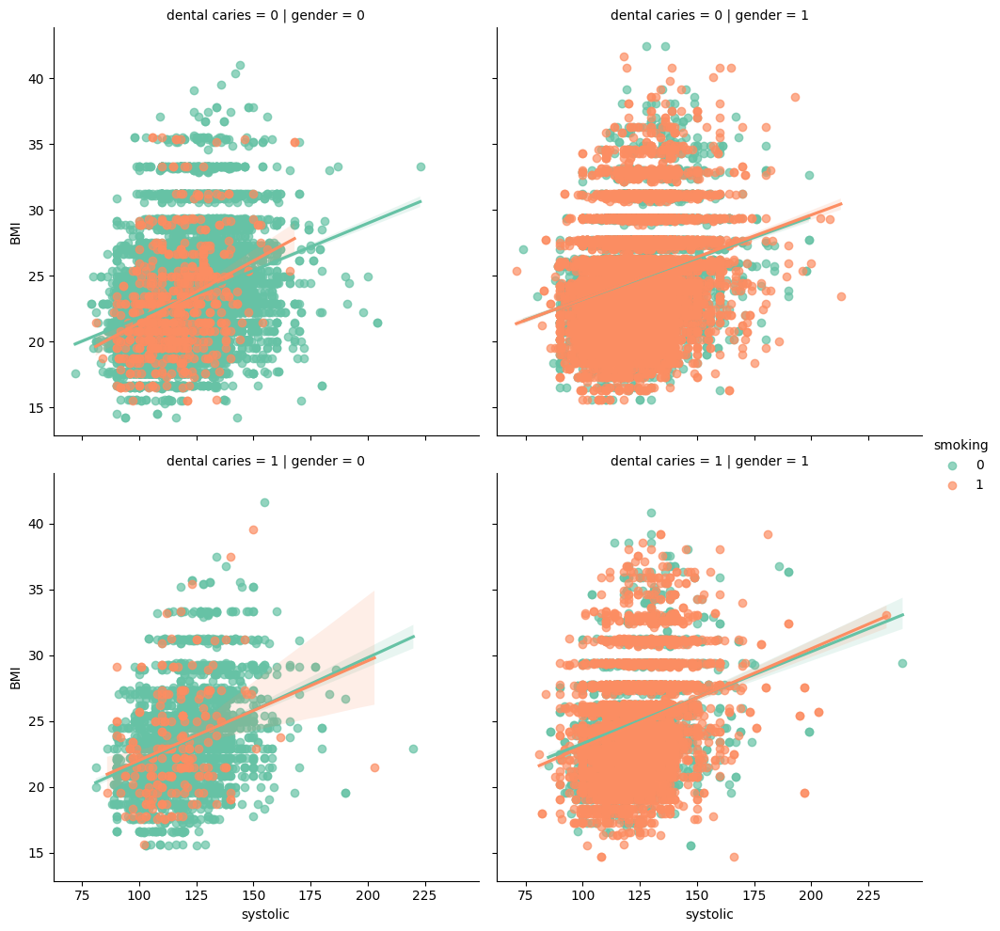

In [94]:
sns.lmplot(data=smoking,x='systolic',y='BMI',palette="Set2", col='gender', row='dental caries', hue='smoking', scatter_kws={'alpha':0.7})
plt.savefig("./pictures/lmpot_gender_caries_smoking-jpg")


#**Data Preprocessing**

In [18]:
label_encoder = preprocessing.LabelEncoder()
smoking['gender'] = label_encoder.fit_transform(smoking['gender'])
smoking['oral'] = label_encoder.fit_transform(smoking['oral'])
smoking['tartar'] = label_encoder.fit_transform(smoking['tartar'])
smoking['gender'] = label_encoder.fit_transform(smoking['gender'])
smoking.head()


,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,...,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,smoking,BMI
0,0,40,155,60,81.3,1.2,1.0,1.0,1.0,114.0,...,1.0,0.7,18.0,19.0,27.0,0,0,1,0,24.973985
1,0,40,160,60,81.0,0.8,0.6,1.0,1.0,119.0,...,1.0,0.6,22.0,19.0,18.0,0,0,1,0,23.437500
2,1,55,170,60,80.0,0.8,0.8,1.0,1.0,138.0,...,1.0,1.0,21.0,16.0,22.0,0,0,0,1,20.761246
3,1,40,165,70,88.0,1.5,1.5,1.0,1.0,100.0,...,1.0,1.0,19.0,26.0,18.0,0,0,1,0,25.711662
4,0,40,155,60,86.0,1.0,1.0,1.0,1.0,120.0,...,1.0,0.6,16.0,14.0,22.0,0,0,0,0,24.973985


In [19]:
scaler = MinMaxScaler()
scal_features = scaler.fit_transform(smoking)
scal_features
data_scal = pd.DataFrame(scal_features, index = smoking.index, columns = smoking.columns)
data_scal.head()

,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,...,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,smoking,BMI
0,0.0,0.307692,0.416667,0.285714,0.388462,0.112245,0.091837,0.0,0.0,0.254438,...,0.0,0.052174,0.009195,0.006179,0.026052,0.0,0.0,1.0,0.0,0.379885
1,0.0,0.307692,0.500000,0.285714,0.384615,0.071429,0.051020,0.0,0.0,0.284024,...,0.0,0.043478,0.012261,0.006179,0.017034,0.0,0.0,1.0,0.0,0.325362
2,1.0,0.538462,0.666667,0.285714,0.371795,0.071429,0.071429,0.0,0.0,0.396450,...,0.0,0.078261,0.011494,0.005149,0.021042,0.0,0.0,0.0,1.0,0.230392
3,1.0,0.307692,0.583333,0.380952,0.474359,0.142857,0.142857,0.0,0.0,0.171598,...,0.0,0.078261,0.009962,0.008582,0.017034,0.0,0.0,1.0,0.0,0.406062
4,0.0,0.307692,0.416667,0.285714,0.448718,0.091837,0.091837,0.0,0.0,0.289941,...,0.0,0.043478,0.007663,0.004463,0.021042,0.0,0.0,0.0,0.0,0.379885


#**Test Train Split**

In [ ]:
dropped_columns=['fasting blood sugar','ALT','systolic','eyesight(right)','eyesight(left)','AST','LDL','Cholesterol','hearing(left)','hearing(right)','Urine protein']

In [20]:
#Select Features
features = data_scal.drop(['smoking'], axis=1)

#Select Target
target = data_scal['smoking']

# Set Training and Testing Data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, target, shuffle = True, test_size = 0.2, random_state = 42)


print('Shape of training feature:', X_train.shape)
print('Shape of testing feature:', X_test.shape)
print('Shape of training label:', y_train.shape)
print('Shape of training label:', y_test.shape)

Shape of training feature: (44553, 26)
Shape of testing feature: (11139, 26)
Shape of training label: (44553,)
Shape of training label: (11139,)


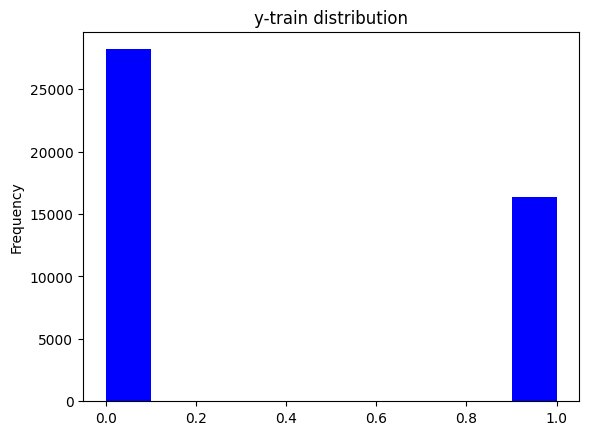

In [ ]:
sns.set_style(None)
y_train.plot.hist(color='blue',)
plt.title('y-train distribution')
plt.show()


Text(0.5, 1.0, 'y-test distribution')

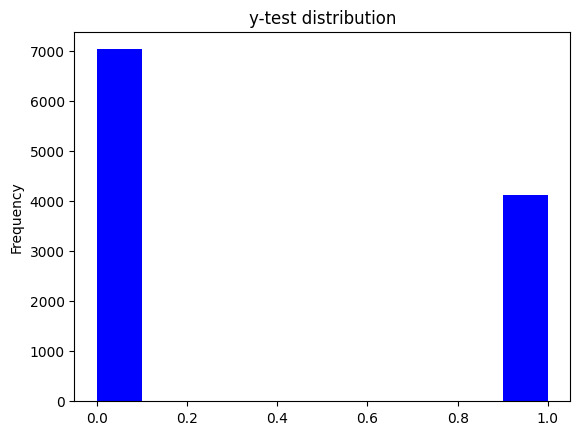

In [ ]:
y_test.plot.hist(color='blue')
plt.title('y-test distribution')

In [21]:
X_train.to_csv("../data/processed/X_Train.csv")
y_train.to_csv("../data/processed/y_train.csv")
X_test.to_csv("../data/processed/X_test.csv")
y_test.to_csv("../data/processed/y_test.csv")

In [22]:
def evaluate_model(model, x_test, y_test):

    # Predict Test Data
    y_pred = model.predict(X_test)

    # Calculate accuracy, precision, recall, f1-score, and kappa score
    acc = metrics.accuracy_score(y_test, y_pred)
    prec = metrics.precision_score(y_test, y_pred)
    rec = metrics.recall_score(y_test, y_pred)
    f1 = metrics.f1_score(y_test, y_pred)
    kappa = metrics.cohen_kappa_score(y_test, y_pred)

    # Calculate area under curve (AUC)
    y_pred_proba = model.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
    auc = metrics.roc_auc_score(y_test, y_pred_proba)

    # Display confussion matrix
    cm = metrics.confusion_matrix(y_test, y_pred)

    return {'acc': acc, 'prec': prec, 'rec': rec, 'f1': f1, 'kappa': kappa,
            'fpr': fpr, 'tpr': tpr, 'auc': auc, 'cm': cm}

# Building Classification Models

#**Logistic Regression**

In [23]:
start_time = timeit.default_timer()
LR_model = LogisticRegression()
LR_model.fit(X_train, y_train)
print("training elapsed time ", timeit.default_timer()-start_time)

training elapsed time  0.3951069019994975


In [24]:
y_train_pred = LR_model.predict(X_train)
print(list(y_train_pred))
print(y_train.to_list())

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0,

In [25]:
y_test_pred = LR_model.predict(X_test)
print(y_test_pred)

[0. 0. 1. ... 0. 0. 1.]


In [26]:
#evaluate model
LR_eval = evaluate_model(LR_model, X_test, y_test)

In [27]:
# Print result
print('Accuracy:', LR_eval['acc'])
print('Precision:', LR_eval['prec'])
print('Recall:', LR_eval['rec'])
print('F1 Score:', LR_eval['f1'])
print('Cohens Kappa Score:', LR_eval['kappa'])
print('Area Under Curve:', LR_eval['auc'])
print('Confusion Matrix:\n', LR_eval['cm'])# Evaluate Model

Accuracy: 0.7365113564951971
Precision: 0.6313909354766689
Recall: 0.6877431906614786
F1 Score: 0.6583634035618671
Cohens Kappa Score: 0.4445625781634215
Area Under Curve: 0.8236183849509867
Confusion Matrix:
 [[5376 1651]
 [1284 2828]]


In [28]:
dump(LR_model, open("../models/logistic_regression_default.sav", "wb"))

#**XG Boost**

In [29]:
xgb = XGBClassifier()
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [30]:
y_train_pred = xgb.predict(X_train)

In [31]:
y_test_pred = xgb.predict(X_test)

In [32]:
#evaluate model
xgb_eval = evaluate_model(xgb, X_test, y_test)

In [33]:
# Print result
print('Accuracy:', xgb_eval['acc'])
print('Precision:', xgb_eval['prec'])
print('Recall:', xgb_eval['rec'])
print('F1 Score:', xgb_eval['f1'])
print('Cohens Kappa Score:', xgb_eval['kappa'])
print('Area Under Curve:', xgb_eval['auc'])
print('Confusion Matrix:\n', xgb_eval['cm'])# Evaluate Model

Accuracy: 0.7768201813448244
Precision: 0.691114245416079
Recall: 0.7149805447470817
F1 Score: 0.7028448481950753
Cohens Kappa Score: 0.5242326220383081
Area Under Curve: 0.8583808409364878
Confusion Matrix:
 [[5713 1314]
 [1172 2940]]


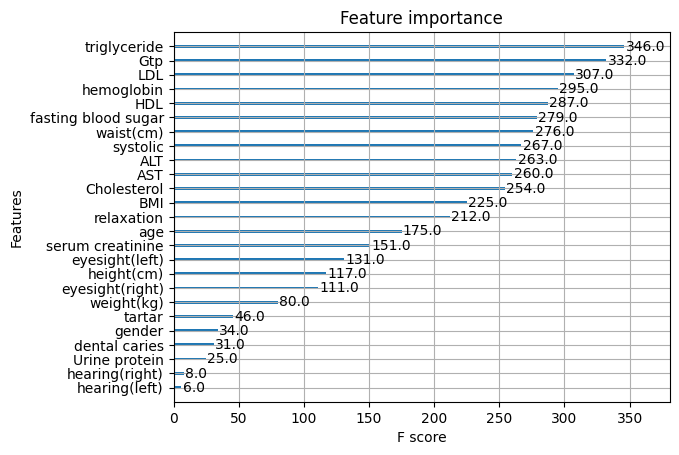

In [34]:
# plot feature importance
plot_importance(xgb)
plt.show()

In [35]:
dump(xgb, open("../models/xg_boost_default.sav", "wb"))

In [ ]:
xgb_importance = xgb.feature_importances_

In [ ]:
corr_df = pd.DataFrame(zip(corr['smoking'].sort_values(ascending=False), xgb_importance), columns = ['Features', 'Importance'])
corr_df.corr()

,Features,Importance
Features,1.000000,0.721643
Importance,0.721643,1.000000


#**Decision Tree Classifier**

In [36]:
model_DT = DecisionTreeClassifier(random_state = 42)
model_DT.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

The below takes too long to plot!

In [ ]:
fig = plt.figure(figsize=(30,30))

tree.plot_tree(model_DT, feature_names = list(X_train.columns), class_names = ["0", "1"], filled = True)
plt.savefig("smoking.jpg")
plt.show()

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x7aad25ebcf70> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7aad25ebc1f0> (for post_execute):


KeyboardInterrupt: 

In [37]:
class_train_pred = model_DT.predict(X_train)
class_test_pred = model_DT.predict(X_test)

In [38]:
#evaluate mode
clf_eval = evaluate_model(model_DT, X_test, y_test)

In [39]:
# Print result
print('Accuracy:', clf_eval['acc'])
print('Precision:', clf_eval['prec'])
print('Recall:', clf_eval['rec'])
print('F1 Score:', clf_eval['f1'])
print('Cohens Kappa Score:', clf_eval['kappa'])
print('Area Under Curve:', clf_eval['auc'])
print('Confusion Matrix:\n', clf_eval['cm'])# Evaluate Model

Accuracy: 0.7821168866145973
Precision: 0.7042424242424242
Recall: 0.7064688715953308
F1 Score: 0.7053538909797257
Cohens Kappa Score: 0.5325036375580574
Area Under Curve: 0.7664264096129493
Confusion Matrix:
 [[5807 1220]
 [1207 2905]]


In [40]:
dump(model_DT, open("../models/decision_tree_default.sav", "wb"))

In [ ]:
print('The Training F1 Score is', f1_score(class_train_pred, y_train))
print('The Testing F1 Score is', f1_score(class_test_pred, y_test))

The Training F1 Score is 1.0
The Testing F1 Score is 0.7053538909797257


In [ ]:
print('The Accuracy Score on the train set is', accuracy_score(class_train_pred, y_train))
print('The Accuracy Score on the test set is', accuracy_score(class_test_pred, y_test))

The Accuracy Score on the train set is 1.0
The Accuracy Score on the test set is 0.7821168866145973


The Decision Tree classifier model is clearly overfitting the data, so now attempt to simplify the model.

In [41]:
#Random Search HyperParameters
parameters = {
              'max_depth':[1,2,3],
              'min_samples_leaf':[1,2,3,4,5],
              'min_samples_split':[2,3,4,5],
              'max_features':['log2','sqrt'],
              'criterion' : ['gini','entropy']
             }
scorer = make_scorer(f1_score)

In [42]:
random = RandomizedSearchCV(model_DT, parameters, scoring=scorer)


In [43]:
# Fit the model to your data
random_out = random.fit(X_train, y_train)
random_out

/home/vscode/.local/lib/python3.10/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


RandomizedSearchCV(estimator=DecisionTreeClassifier(random_state=42),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [1, 2, 3],
                                        'max_features': ['log2', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 3, 4, 5],
                                        'min_samples_split': [2, 3, 4, 5]},
                   scoring=make_scorer(f1_score, response_method='predict'))

In [44]:
best = random_out.best_estimator_
best

DecisionTreeClassifier(max_depth=3, max_features='sqrt', min_samples_leaf=3,
                       min_samples_split=4, random_state=42)

In [45]:
class_train_pred = best.predict(X_train)
class_test_pred = best.predict(X_test)

In [46]:
#evaluate model
best_clf_eval = evaluate_model(best, X_test, y_test)


In [93]:
# Print result
print('Accuracy:', best_clf_eval['acc'])
print('Precision:', best_clf_eval['prec'])
print('Recall:', best_clf_eval['rec'])
print('F1 Score:', best_clf_eval['f1'])
print('Cohens Kappa Score:', best_clf_eval['kappa'])
print('Area Under Curve:', best_clf_eval['auc'])
print('Confusion Matrix:\n', best_clf_eval['cm'])# Evaluate Model

Accuracy: 0.7013196875841637
Precision: 0.5554770318021202
Recall: 0.955739299610895
F1 Score: 0.7026012335746848
Cohens Kappa Score: 0.44210418465221013
Area Under Curve: 0.7607705915039213
Confusion Matrix:
 [[3882 3145]
 [ 182 3930]]


In [94]:
print('The Training F1 Score is', f1_score(class_train_pred, y_train))
print('The Testing F1 Score is', f1_score(class_test_pred, y_test))

The Training F1 Score is 0.7014260449081018
The Testing F1 Score is 0.7026012335746848


In [95]:
print('The Training Accuracy Score is', accuracy_score(class_train_pred, y_train))
print('The Testing Accuracy Score is', accuracy_score(class_test_pred, y_test))

The Training Accuracy Score is 0.7006486656341885
The Testing Accuracy Score is 0.7013196875841637


In [47]:
dump(model_DT, open("../models/decision_tree_best_default_42.sav", "wb"))

#**Random Forest Classifier**

merge machine learning with random search and grid search



Attempted Random Forest with BMI included, but seems to heavily rely on it. 2nd attempt with BMI dropped.

In [82]:
model_rand = RandomForestClassifier(n_estimators = 100, random_state = 42)
model_rand.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
fig, axis = plt.subplots(2, 2, figsize = (30, 30))

# We show the first 4 trees out of the 100 generated (default)
tree.plot_tree(model_rand.estimators_[0], ax = axis[0, 0], feature_names = list(X_train.columns), class_names = ["0", "1"], filled = True)
tree.plot_tree(model_rand.estimators_[1], ax = axis[0, 1], feature_names = list(X_train.columns), class_names = ["0", "1"], filled = True)
tree.plot_tree(model_rand.estimators_[2], ax = axis[1, 0], feature_names = list(X_train.columns), class_names = ["0", "1"], filled = True)
tree.plot_tree(model_rand.estimators_[3], ax = axis[1, 1], feature_names = list(X_train.columns), class_names = ["0", "1"], filled = True)

plt.show()

KeyboardInterrupt: 

In [83]:
y_train_pred = model_rand.predict(X_train)
y_train_pred

array([1, 0, 0, ..., 0, 0, 1])

In [84]:
y_test_pred = model_rand.predict(X_test)
y_test_pred

array([0, 0, 1, ..., 0, 0, 1])

In [85]:
#evaluate model
rand_eval = evaluate_model(model_rand, X_test, y_test)

In [92]:
dump(model_rand, open("../models/random_forest_classifier_default_42.sav", "wb"))


In [86]:
#Random Search HyperParameters
parameters = {
              'n_estimators':[10,20,50,100],
              'max_depth':[1,2,3,4],
              'min_samples_leaf':[1,2,3,4,5],
              'min_samples_split':[2,3,4,5],
              'max_features':[3,4,5,6,7,8]
             }
scorer = make_scorer(f1_score)

In [87]:
random = RandomizedSearchCV(model_rand, parameters, scoring=scorer)
random

RandomizedSearchCV(estimator=RandomForestClassifier(random_state=42),
                   param_distributions={'max_depth': [1, 2, 3, 4],
                                        'max_features': [3, 4, 5, 6, 7, 8],
                                        'min_samples_leaf': [1, 2, 3, 4, 5],
                                        'min_samples_split': [2, 3, 4, 5],
                                        'n_estimators': [10, 20, 50, 100]},
                   scoring=make_scorer(f1_score, response_method='predict'))

In [88]:
# Fit the model to your data
random_out = random.fit(X_train, y_train)
random_out

RandomizedSearchCV(estimator=RandomForestClassifier(random_state=42),
                   param_distributions={'max_depth': [1, 2, 3, 4],
                                        'max_features': [3, 4, 5, 6, 7, 8],
                                        'min_samples_leaf': [1, 2, 3, 4, 5],
                                        'min_samples_split': [2, 3, 4, 5],
                                        'n_estimators': [10, 20, 50, 100]},
                   scoring=make_scorer(f1_score, response_method='predict'))

In [89]:
best = random_out.best_estimator_
best

RandomForestClassifier(max_depth=4, max_features=6, min_samples_leaf=2,
                       n_estimators=10, random_state=42)

In [90]:
class_train_pred = best.predict(X_train)
class_test_pred = best.predict(X_test)

In [91]:
#evaluate model
best_rand_eval = evaluate_model(best, X_test, y_test)

In [93]:
dump(best, open("../models/random_forest_best_default.sav", "wb"))

In [ ]:
print('The Training F1 Score is', f1_score(class_train_pred, y_train))
print('The Testing F1 Score is', f1_score(class_test_pred, y_test))

The Training F1 Score is 0.6733600315866659
The Testing F1 Score is 0.6634377111962154


In [ ]:
print('The Accuracy Score is', accuracy_score(class_train_pred, y_train))
print('The Accuracy Score is', accuracy_score(class_test_pred, y_test))

The Accuracy Score is 0.7400399524162233
The Accuracy Score is 0.7317532992189604


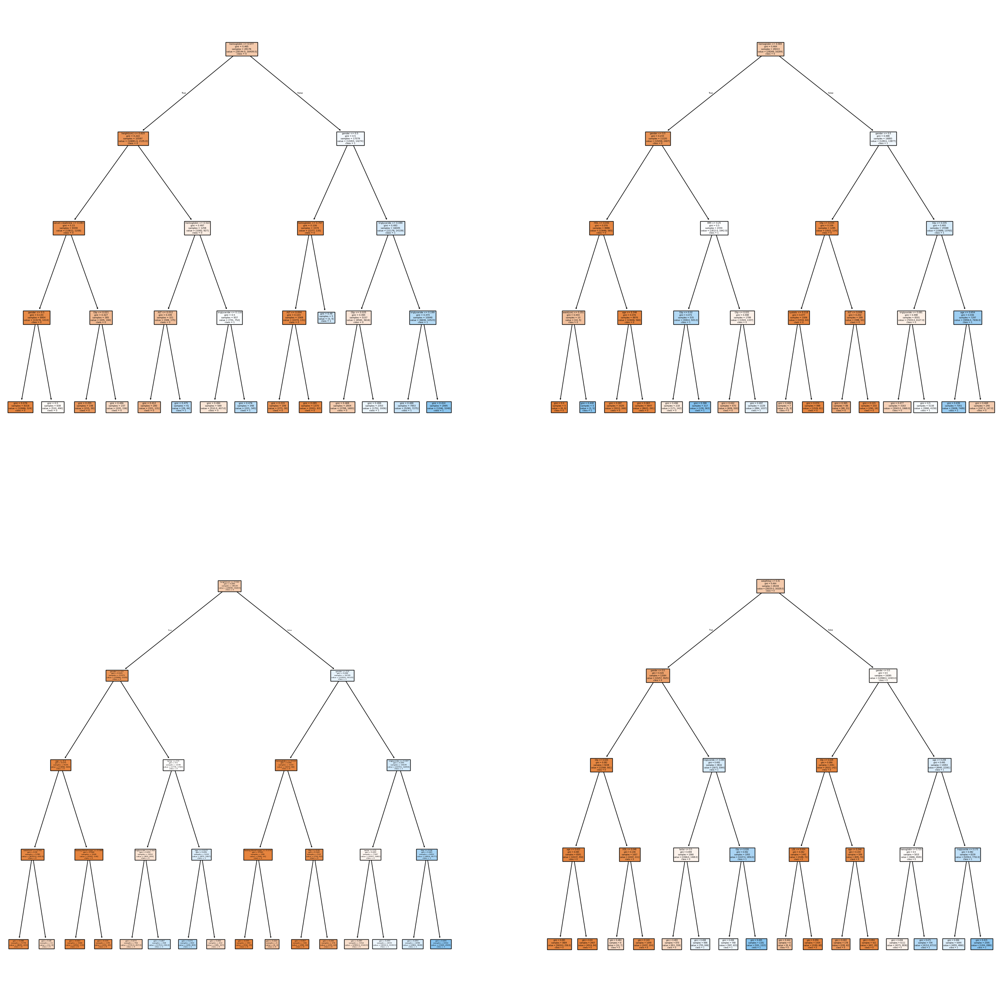

In [ ]:
fig, axis = plt.subplots(2, 2, figsize = (30, 30))

# We show the first 4 trees out of the 100 generated (default)
tree.plot_tree(best.estimators_[0], ax = axis[0, 0], feature_names = list(X_train.columns), class_names = ["0", "1"], filled = True)
tree.plot_tree(best.estimators_[1], ax = axis[0, 1], feature_names = list(X_train.columns), class_names = ["0", "1"], filled = True)
tree.plot_tree(best.estimators_[2], ax = axis[1, 0], feature_names = list(X_train.columns), class_names = ["0", "1"], filled = True)
tree.plot_tree(best.estimators_[3], ax = axis[1, 1], feature_names = list(X_train.columns), class_names = ["0", "1"], filled = True)

plt.show()

Text(0.5, 1.0, 'Feature Importance')

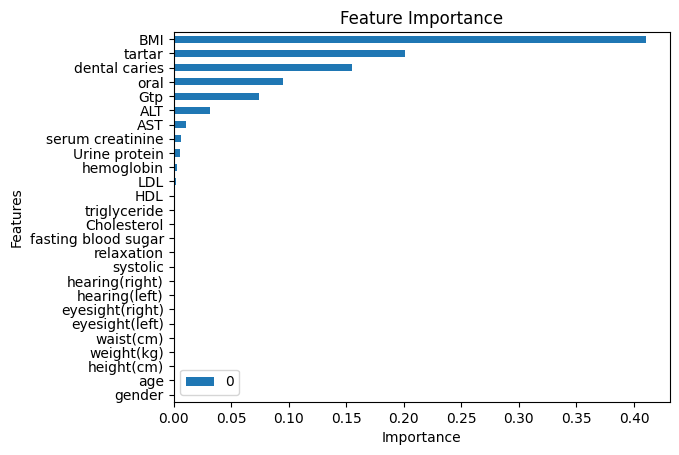

In [ ]:
pd.DataFrame(best.feature_importances_).sort_values(by=0, ascending=True).plot.barh()
plt.ylabel("Features")
plt.yticks(np.arange(len(X_train.columns)), list(X_train.columns))
plt.xlabel("Importance")
plt.title("Feature Importance")

#**SVR**

In [48]:
model_SVR = SVR()
model_SVR.fit(X_train, y_train)

SVR()

In [49]:
SVR_train_predict = model_SVR.predict(X_train)
SVR_test_predict = model_SVR.predict(X_test)

In [ ]:
print('The Training MSE is', mean_squared_error(SVR_train_predict, y_train))
print('The Testing MSE is', mean_squared_error(SVR_test_predict, y_test))

The Training MSE is 0.17028014848635672
The Testing MSE is 0.17635182400828656


In [ ]:
train_rmse = np.sqrt(mean_squared_error(SVR_train_predict, y_train))
test_rmse = np.sqrt(mean_squared_error(SVR_test_predict, y_test))


In [ ]:
print('The Training RMSE is', train_rmse)
print('The Testing RMSE is', test_rmse)

The Training RMSE is 0.4126501526551962
The Testing RMSE is 0.419942643712551


In [51]:
dump(model_SVR, open("../models/SVR_default.sav", "wb"))

#**K-Nearest Neighbour**

In [52]:
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)

KNeighborsClassifier()

In [53]:
knn_train_predict = knn_model.predict(X_train)
knn_test_predict = knn_model.predict(X_test)


In [54]:
#evaluate model
knn_eval = evaluate_model(knn_model, X_test, y_test)

In [55]:
print('The Training Accuracy Score is', accuracy_score(knn_train_predict, y_train))
print('The Testing Accuracy Score is', accuracy_score(knn_test_predict, y_test))

The Training Accuracy Score is 0.819899894507665
The Testing Accuracy Score is 0.738665948469342


In [56]:
print('The Training F1 Score is', f1_score(knn_train_predict, y_train))
print('The Testing F1 Score is', f1_score(knn_test_predict, y_test))

The Training F1 Score is 0.7528795811518325
The Testing F1 Score is 0.643914373088685


In [57]:
dump(knn_model, open("../models/knn_default.sav", "wb"))

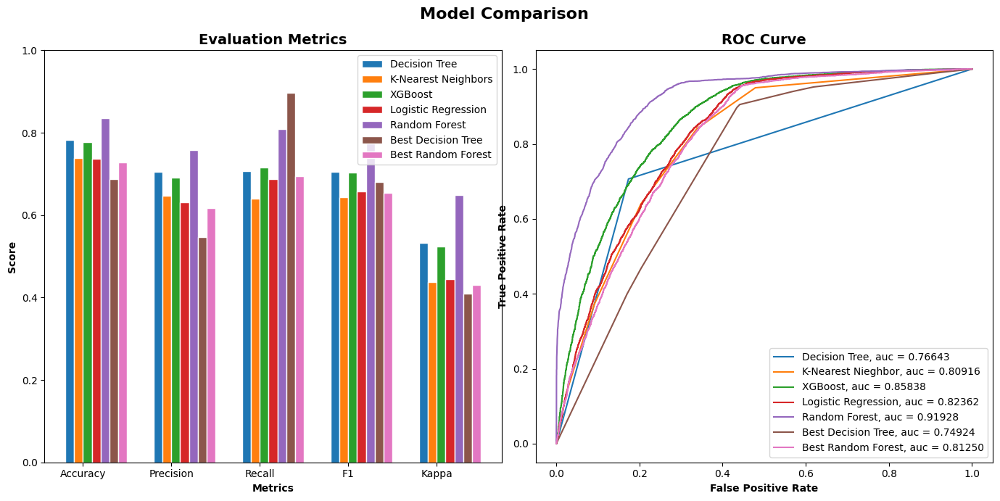

'\n# Save the model to a file\nwith open("./models/smoking_classifier.sav", "wb") as f:\n    pickle.dump(knn, f)\n    '

In [70]:
from uuid import RFC_4122
# Intitialize figure with two plots
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.suptitle('Model Comparison', fontsize=16, fontweight='bold')
fig.set_figheight(7)
fig.set_figwidth(14)
fig.set_facecolor('white')


# First plot
## set bar size
barWidth = 0.1
clf_score = [clf_eval['acc'], clf_eval['prec'], clf_eval['rec'], clf_eval['f1'], clf_eval['kappa']]
knn_score = [knn_eval['acc'], knn_eval['prec'], knn_eval['rec'], knn_eval['f1'], knn_eval['kappa']]
xgb_score = [xgb_eval['acc'], xgb_eval['prec'], xgb_eval['rec'], xgb_eval['f1'], xgb_eval['kappa']]
LR_score = [LR_eval['acc'], LR_eval['prec'], LR_eval['rec'], LR_eval['f1'], LR_eval['kappa']]
rand_score = [rand_eval['acc'], rand_eval['prec'], rand_eval['rec'], rand_eval['f1'], rand_eval['kappa']]
best_score = [best_clf_eval['acc'], best_clf_eval['prec'], best_clf_eval['rec'], best_clf_eval['f1'], best_clf_eval['kappa']]
best_rand_score = [best_rand_eval['acc'], best_rand_eval['prec'], best_rand_eval['rec'], best_rand_eval['f1'], best_rand_eval['kappa']]

## Set position of bar on X axis
r1 = np.arange(len(clf_score))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
r5 = [x + barWidth for x in r4]
r6 = [x + barWidth for x in r5]
r7 = [x + barWidth for x in r6]

## Make the plot
ax1.bar(r1, clf_score, width=barWidth, edgecolor='white', label='Decision Tree')
ax1.bar(r2, knn_score, width=barWidth, edgecolor='white', label='K-Nearest Neighbors')
ax1.bar(r3, xgb_score, width=barWidth, edgecolor='white', label='XGBoost')
ax1.bar(r4, LR_score, width=barWidth, edgecolor='white', label='Logistic Regression')
ax1.bar(r5, rand_score, width=barWidth, edgecolor='white', label='Random Forest')
ax1.bar(r6, best_score, width=barWidth, edgecolor='white', label='Best Decision Tree')
ax1.bar(r7, best_rand_score, width=barWidth, edgecolor='white', label='Best Random Forest')

## Configure x and y axis
ax1.set_xlabel('Metrics', fontweight='bold')
labels = ['Accuracy', 'Precision', 'Recall', 'F1', 'Kappa']
ax1.set_xticks([r + (barWidth * 1.5) for r in range(len(clf_score))], )
ax1.set_xticklabels(labels)
ax1.set_ylabel('Score', fontweight='bold')
ax1.set_ylim(0, 1)

## Create legend & title
ax1.set_title('Evaluation Metrics', fontsize=14, fontweight='bold')
plt.tight_layout()
ax1.legend()

# Second plot
## Comparing ROC Curve
ax2.plot(clf_eval['fpr'], clf_eval['tpr'], label='Decision Tree, auc = {:0.5f}'.format(clf_eval['auc']))
ax2.plot(knn_eval['fpr'], knn_eval['tpr'], label='K-Nearest Nieghbor, auc = {:0.5f}'.format(knn_eval['auc']))
ax2.plot(xgb_eval['fpr'], xgb_eval['tpr'], label='XGBoost, auc = {:0.5f}'.format(xgb_eval['auc']))
ax2.plot(LR_eval['fpr'], LR_eval['tpr'], label='Logistic Regression, auc = {:0.5f}'.format(LR_eval['auc']))
ax2.plot(rand_eval['fpr'], rand_eval['tpr'], label='Random Forest, auc = {:0.5f}'.format(rand_eval['auc']))
ax2.plot(best_clf_eval['fpr'], best_clf_eval['tpr'], label='Best Decision Tree, auc = {:0.5f}'.format(best_clf_eval['auc']))
ax2.plot(best_rand_eval['fpr'], best_rand_eval['tpr'], label='Best Random Forest, auc = {:0.5f}'.format(best_rand_eval['auc']))


## Configure x and y axis
ax2.set_xlabel('False Positive Rate', fontweight='bold')
ax2.set_ylabel('True Positive Rate', fontweight='bold')

## Create legend & title
ax2.set_title('ROC Curve', fontsize=14, fontweight='bold')
ax2.legend(loc=4)

plt.savefig("/workspaces/Smoking_classifier/src/pictures/model_comparison.jpg")
plt.show()
"""
# Save the model to a file
with open("./models/smoking_classifier.sav", "wb") as f:
    pickle.dump(knn, f)
    """

#**K-Means Deep Learning**

In [72]:
kmeans_model = KMeans(n_clusters=6,n_init = "auto", random_state=42)
kmeans_model.fit(X_train)

KMeans(n_clusters=6, random_state=42)

In [73]:
y_train = list(kmeans_model.labels_)


In [74]:
X_train["cluster"] = y_train
X_train.head()

,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,...,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,BMI,cluster
10126,1,60,165,55,76.0,1.0,1.0,1.0,1.0,96.0,...,1.0,0.7,26.0,21.0,17.0,0,0,1,20.202020,0
2467,1,40,175,80,94.0,1.0,1.0,1.0,1.0,126.0,...,1.0,0.9,15.0,15.0,35.0,0,1,1,26.122449,3
36288,1,35,180,90,98.0,1.2,1.5,1.0,1.0,117.0,...,1.0,0.8,21.0,26.0,15.0,0,0,1,27.777778,0
32339,1,40,175,70,77.8,1.0,1.2,1.0,1.0,118.0,...,1.0,0.9,18.0,13.0,20.0,0,0,0,22.857143,2
29452,1,45,175,65,78.0,1.5,1.5,1.0,1.0,112.0,...,1.0,0.9,19.0,18.0,39.0,0,0,1,21.224490,3


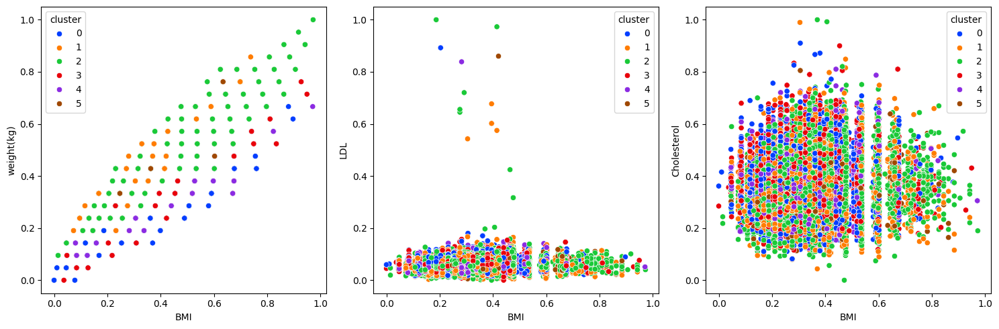

In [ ]:
fig, axis = plt.subplots(1, 3, figsize = (15, 5))

sns.scatterplot(ax = axis[0], data = X_train, x = "BMI", y = "weight(kg)", hue = "cluster", palette = "bright")
sns.scatterplot(ax = axis[1], data = X_train, x = "BMI", y = "LDL", hue = "cluster", palette = "bright")
sns.scatterplot(ax = axis[2], data = X_train, x = "BMI", y = "Cholesterol", hue = "cluster", palette = "bright")


plt.tight_layout()

plt.show()

In [77]:
y_test = list(kmeans_model.predict(X_test))
X_test["cluster"] = y_test
X_test.head()

,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,...,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,BMI,cluster
33967,0,45,160,55,71.0,1.0,0.5,1.0,1.0,111.0,...,1.0,0.8,17.0,10.0,11.0,0,0,1,21.484375,0
21956,0,55,145,40,80.4,0.8,0.5,1.0,1.0,104.0,...,1.0,0.7,24.0,14.0,19.0,0,1,0,19.024970,4
15458,1,25,170,80,94.0,1.0,1.2,1.0,1.0,110.0,...,1.0,0.8,82.0,146.0,248.0,0,1,0,27.681661,5
36215,1,45,170,70,82.0,0.5,0.4,1.0,1.0,124.0,...,1.0,0.6,27.0,45.0,70.0,0,0,0,24.221453,1
8886,1,40,165,60,77.0,1.2,1.2,1.0,1.0,123.0,...,1.0,1.0,40.0,69.0,55.0,0,0,0,22.038567,4


In [75]:
dump(kmeans_model, open("../models/k_means_default.sav", "wb"))

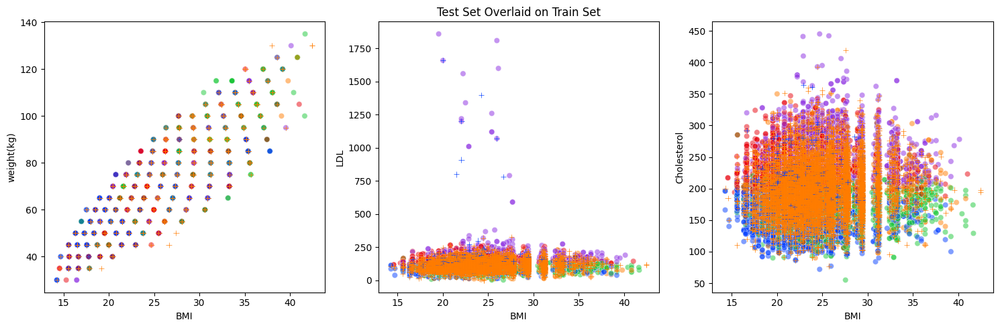

In [ ]:
fig, axis = plt.subplots(1, 3, figsize = (15, 5))

sns.scatterplot(ax = axis[0], data = X_train, x = "BMI", y = "weight(kg)", hue = "cluster", palette = "bright", alpha = 0.5)
sns.scatterplot(ax = axis[1], data = X_train, x = "BMI", y = "LDL", hue = "cluster", palette = "bright", alpha = 0.5)
sns.scatterplot(ax = axis[2], data = X_train, x = "BMI", y = "Cholesterol", hue = "cluster", palette = "bright", alpha = 0.5)

sns.scatterplot(ax = axis[0], data = X_test, x = "BMI", y = "weight(kg)", hue = "cluster", palette = "bright", marker='+')
sns.scatterplot(ax = axis[1], data = X_test, x = "BMI", y = "LDL", hue = "cluster", palette = "bright", marker='+')
sns.scatterplot(ax = axis[2], data = X_test, x = "BMI", y = "Cholesterol", hue = "cluster", palette = "bright", marker='+')
axis[1].set_title("Test Set Overlaid on Train Set")
plt.tight_layout()

for ax in axis:
    ax.legend([],[], frameon=False)

plt.show()

#**Multi-Layer Perceptor**

In [78]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [79]:
def create_model(input_dim):
    model = Sequential([
        Dense(64, activation='relu', input_dim=input_dim),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dropout(0.3),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    return model

In [80]:
# Train the model
def train_model(model, X_train, y_train, X_test, y_test):
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    history = model.fit(X_train, y_train,
                        epochs=100,
                        batch_size=32,
                        validation_data=(X_test, y_test),
                        callbacks=[early_stopping])

    return history

In [81]:
# Main execution
if __name__ == "__main__":
    # Load and preprocess the data
    X_train, X_test, y_train, y_test = train_test_split(features, target, shuffle = True, test_size = 0.2, random_state = 42)

    # Create the model
    model = create_model(input_dim=X_train.shape[1])

    # Train the model
    history = train_model(model, X_train, y_train, X_test, y_test)

    # Evaluate the model
    test_loss, test_accuracy = model.evaluate(X_test, y_test)
    print(f"Test accuracy: {test_accuracy:.4f}")

    # Make predictions
    predictions = model.predict(X_test)

/home/vscode/.local/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100


1393/1393 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.5959 - loss: 1.3814 - val_accuracy: 0.6319 - val_loss: 0.6063
Epoch 2/100
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.6539 - loss: 0.6072 - val_accuracy: 0.6905 - val_loss: 0.5685
Epoch 3/100
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.6874 - loss: 0.5606 - val_accuracy: 0.7083 - val_loss: 0.5438
Epoch 4/100
 777/1393 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7024 - loss: 0.5475

KeyboardInterrupt: 

#**LeNet Model**

In [ ]:
# Build the LeNet-like model for tabular data
def create_lenet_tabular_model(input_shape):
    model = Sequential([
        Conv1D(6, kernel_size=3, activation='relu', padding='same', input_shape=input_shape),
        MaxPooling1D(pool_size=2),
        Conv1D(16, kernel_size=3, activation='relu', padding='same'),
        MaxPooling1D(pool_size=2),
        Flatten(),
        Dense(120, activation='relu'),
        Dropout(0.3),
        Dense(84, activation='relu'),
        Dropout(0.3),
        Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    return model

# Train the model
def train_model(model, X_train, y_train, X_test, y_test, epochs=100, batch_size=32):
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    history = model.fit(X_train, y_train,
                        epochs=epochs,
                        batch_size=batch_size,
                        validation_data=(X_test, y_test),
                        callbacks=[early_stopping])

    return history

# Main execution
if __name__ == "__main__":
    # Load and preprocess the data
    X_train, X_test, y_train, y_test = train_test_split(features, target, shuffle = True, test_size = 0.2, random_state = 42)

    # Create the model
    model = create_lenet_tabular_model(input_shape=(X_train.shape[1], 1))

    # Train the model
    history = train_model(model, X_train, y_train, X_test, y_test)

    # Evaluate the model
    test_loss, test_accuracy = model.evaluate(X_test, y_test)
    print(f"Test accuracy: {test_accuracy:.4f}")

    # Make predictions
    predictions = model.predict(X_test)

    # You can further analyze predictions, create confusion matrix, etc.

Epoch 1/100
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 13s 8ms/step - accuracy: 0.6572 - loss: 0.7673 - val_accuracy: 0.7125 - val_loss: 0.5433
Epoch 2/100
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 14s 4ms/step - accuracy: 0.7098 - loss: 0.5465 - val_accuracy: 0.7115 - val_loss: 0.5335
Epoch 3/100
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7147 - loss: 0.5407 - val_accuracy: 0.7201 - val_loss: 0.5285
Epoch 4/100
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.7246 - loss: 0.5278 - val_accuracy: 0.7205 - val_loss: 0.5208
Epoch 5/100
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.7295 - loss: 0.5193 - val_accuracy: 0.7236 - val_loss: 0.5188
Epoch 6/100
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step - accuracy: 0.7285 - loss: 0.5197 - val_accuracy: 0.7179 - val_loss: 0.5265
Epoch 7/100
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.7282 - loss: 0.5158 - val_accuracy: 0.7249 - val_loss: 0.5154
Epoch 8/100
1393/1393 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - accuracy: 0.7355 - loss

#**Conclusion**


In [39]:
!pip install nbformat


Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.5/88.5 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.8/354.8 kB 11.5 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: pip install --upgrade pip


In [40]:
!pip install nbconvert

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 257.4/257.4 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.0/48.0 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.9/147.9 kB 6.4 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: pip install --upgrade pip


In [47]:
import nbformat
from nbconvert import HTMLExporter

app = flask.Flask(__name__)

@app.route('/render_notebook/smoking.ipynb')
def render_notebook(filename):
    notebook_path = f'notebooks/{"/workspaces/Smoking_classifier/src/smoking.ipynb"}.ipynb'

    try:
        # Read the notebook
        with open(notebook_path, 'r') as f:
            notebook = nbformat.read(f, as_version=4)

        # Convert to HTML
        html_exporter = HTMLExporter()
        html = html_exporter.from_notebook_node(notebook)

        # Render the HTML
        return flask.render_template('notebook.html', html=html)

    except Exception as e:
        return f"Error rendering notebook: {e}"

if __name__ == '__main__':
    app.run(debug=True)


NameError: name 'flask' is not defined